In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 컨볼루션 신경망(Convolution Neural Networks, CNN)

- 완전 연결 네트워크의 문제점으로부터 시작
  - 매개변수의 폭발적인 증가
  - 공간 추론의 부족: 픽셀 사이의 근접성 개념이 완전 연결 계층(Fully-Connected Layer)에서는 손실됨
- 동물의 시각피질(visual cortex, 視覺皮質)의 구조에서 영감을 받아 만들어진 딥러닝 신경망 모델
- 시각피질의 신경세포
  - 시야 내의 특정 영역에 대한 자극만 수용
  - 수용장(receptive field, 受容場)
  - 해당 영역의 특정 특징에 대해서만 반응
- 시각 자극이 1차 시각피질을 통해서 처리된 다음, 2차 시각피질을 경유하여, 3차 시각피질 등 여러 영역을 통과하여 계층적인 정보처리
- 정보가 계층적으로 처리되어 가면서 점차 추상적인 특징이 추출되어 시각 인식
- 동물의 계층적 특징 추출과 시각인식 체계를 참조하여 만들어진 모델
  - 전반부 : 컨볼루션 연산을 수행하여 특징 추출
  - 후반부 : 특징을 이용하여 분류
- 영상분류, 문자 인식 등 인식문제에 높은 성능

  <img src="https://upload.wikimedia.org/wikipedia/commons/6/63/Typical_cnn.png">

# 컨볼루션 연산 (Convolution Operation)

- 필터(filter) 연산
  - 입력 데이터에 필터를 통한 어떠한 연산을 진행
  - 필터에 대응하는 원소끼리 곱하고, 그 합을 구함
  - 연산이 완료된 결과 데이터를 **특징 맵(feature map)**이라 부름

- 필터(filter)
  - 커널(kernel)이라고도 함
  - 이미지 처리에서 사용하는 '이미지 필터'와 비슷한 개념
  - 필터의 사이즈는 거의 항상 홀수
    - 짝수이면 패딩이 비대칭이 되어버림
    - 왼쪽, 오른쪽을 다르게 주어야함
    - 중심위치가 존재, 즉 구별된 하나의 픽셀(중심 픽셀)이 존재
  - 필터의 학습 파라미터 개수는 입력 데이터의 크기와 상관없이 일정  
  - 과적합을 방지할 수 있음

  <img src="https://theano-pymc.readthedocs.io/en/latest/_images/numerical_padding_strides.gif">

- 연산 시각화
  <img src="https://www.researchgate.net/profile/Ihab_S_Mohamed/publication/324165524/figure/fig3/AS:611103423860736@1522709818959/An-example-of-convolution-operation-in-2D-2.png" width="500">

- 일반적으로, 합성곱 연산을 한 후의 데이터 사이즈

  $\quad (n-f+1) \times (n-f+1)$

  $n$: 입력 데이터의 크기  
  $f$: 필터(커널)의 크기

  <img src="https://miro.medium.com/max/1400/1*Fw-ehcNBR9byHtho-Rxbtw.gif" width="400">

- 위 예에서 입력 데이터 크기($n$)는 5, 필터의 크기($k$)는 3이므로 출력 데이터의 크기는 $(5 - 3 + 1) = 3$

In [ ]:
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
from sklearn.datasets import load_sample_image
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

from tensorflow.keras.layers import Conv2D

<ipython-input-2-ab2eaa1a30e7>:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


float64
(427, 640, 3)


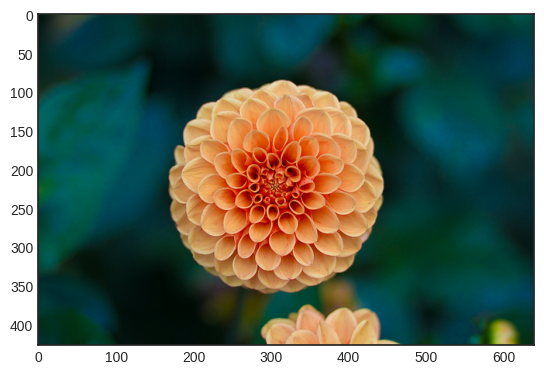

In [ ]:
flower = load_sample_image('flower.jpg') / 255 #하나의 픽셀이 담을 수 있는 정보가 0~255, uint8이 아닌 float(0~1)사이 값으로 가질 수 있도록 255로 나눔
print(flower.dtype)
print(flower.shape)
plt.imshow(flower)
plt.show()

float64
(427, 640, 3)


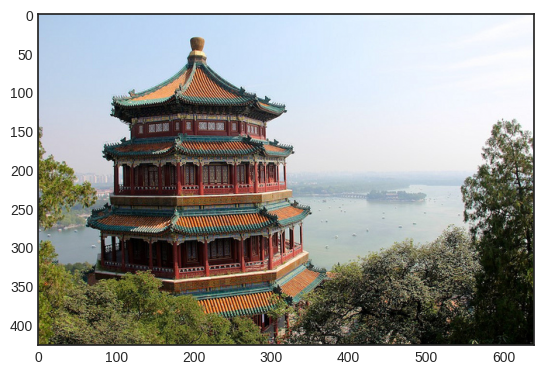

In [ ]:
china = load_sample_image('china.jpg') / 255
print(china.dtype)
print(china.shape)
plt.imshow(china)
plt.show()

In [ ]:
images = np.array([china, flower])
batch_size, height, width, channels=images.shape #2, 427, 640, 3 데이터 두개를 묶었으니 batch_size는 2
print(images.shape)

(2, 427, 640, 3)


In [ ]:
filters = np.zeros(shape=(7, 7, channels, 2), dtype=np.float32) #channel은 RGB라 3
filters[:, 3, :, 0] = 1
filters[3, :, :, 1] = 1

print(filters.shape)

(7, 7, 3, 2)


In [ ]:
#conv2d인 레이어 추가
conv = Conv2D(filters=16, kernel_size=3, activation='relu')

# 패딩(Padding)과 스트라이드(Stride)

- 필터(커널) 사이즈과 함께 입력 이미지와 출력 이미지의 사이즈를 결정하기 위해 사용
- 사용자가 결정할 수 있음


## 패딩(Padding)

- 입력 데이터의 주변을 특정 값으로 채우는 기법
  - 주로 0으로 많이 채움

  <img src="https://miro.medium.com/max/395/1*1okwhewf5KCtIPaFib4XaA.gif" width="300">

- 출력 데이터의 크기

  $\quad (n+2p-f+1) \times (n+2p-f+1)$

  - 위 그림에서, 입력 데이터의 크기($n$)는 5, 필터의 크기($f$)는 3, 패딩값($p$)은 1이므로 출력 데이터의 크기는 ($5 + 2\times 1 - 3 + 1) = 6$

- `valid`
  - 패딩을 주지 않음
  - `padding=0`은 0으로 채워진 테두리가 아니라 패딩을 주지 않는다는 의미
- `same`
  - 패딩을 주어 입력 이미지의 크기와 연산 후의 이미지 크기를 같도록 유지
  - 만약, 필터(커널)의 크기가 $k$ 이면, 패딩의 크기는 $p = \frac{k-1}{2}$ (단, stride=1)

## 스트라이드(Stride)

- 필터를 적용하는 간격을 의미
- 아래 예제 그림은 간격이 2

  <img src="https://miro.medium.com/max/294/1*BMngs93_rm2_BpJFH2mS0Q.gif">

## 출력 데이터의 크기

  $\qquad OH = \frac{H + 2P - FH}{S} + 1 $
  
  $\qquad OW = \frac{W + 2P - FW}{S} + 1 $

  - 입력 크기 : $(H, W)$
  - 필터 크기 : $(FH, FW)$
  - 출력 크기 : $(OH, OW)$
  - 패딩, 스트라이드 : $P, S$

- 위 식의 값에서 $\frac{H + 2P - FH}{S}$ 또는 $\frac{W + 2P - FW}{S}$가 정수로 나누어 떨어지는 값이어야 함
- 정수로 나누어 떨어지지 않으면, 패딩, 스트라이드 값을 조정하여 정수로 나누어 떨어지게 해야함
  
  

In [ ]:
conv = Conv2D(filters=16, kernel_size=3, padding='same', strides=1, activation='relu')

# 풀링(Pooling)

- 필터(커널) 사이즈 내에서 특정 값을 추출하는 과정

## 맥스 풀링(Max Pooling)

- 가장 많이 사용되는 방법
- 출력 데이터의 사이즈 계산은 컨볼루션 연산과 동일

  $\quad OH = \frac{H + 2P - FH}{S} + 1 $
  
  $\quad OW = \frac{W + 2P - FW}{S} + 1 $

- 일반적으로 stride=2, kernel_size=2 를 통해 특징맵의 크기를 절반으로 줄이는 역할
- 모델이 물체의 주요한 특징을 학습할 수 있도록 해주며, 컨볼루션 신경망이 이동 불변성 특성을 가지게 해줌
- 예를 들어, 아래의 그림에서 초록색 사각형 안에 있는 2와 8의 위치를 바꾼다해도 맥스 풀링 연산은 8을 추출
- 모델의 파라미터 개수를 줄여주고, 연산 속도를 빠르게 함

  <img src="https://cs231n.github.io/assets/cnn/maxpool.jpeg" width="600">

In [ ]:
from tensorflow.keras.layers import MaxPool2D

In [ ]:
print(flower.shape)
flower = np.expand_dims(flower, axis=0)
print = (flower.shape)

output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = MaxPool2D(pool_size=2)(output)
print(output.shape)

(427, 640, 3)


TypeError: ignored

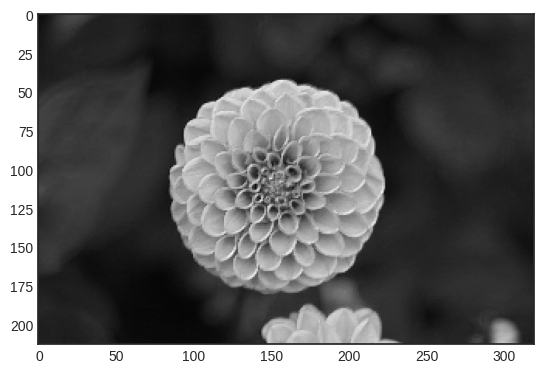

In [ ]:
plt.imshow(output[0,:,:,4], cmap = 'gray')
plt.show()

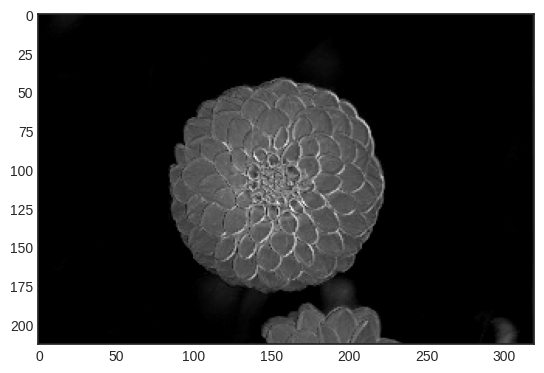

In [ ]:
plt.imshow(output[0,:,:,8], cmap = 'gray')
plt.show()

## 평균 풀링(Avg Pooling)

- 필터 내의 있는 픽셀값의 평균을 구하는 과정
- 과거에 많이 사용, 요즘은 잘 사용되지 않음
- 맥스풀링과 마찬가지로 stride=2, kernel_size=2 를 통해 특징 맵의 사이즈를 줄이는 역할

  <img src="https://www.researchgate.net/profile/Juan_Pedro_Dominguez-Morales/publication/329885401/figure/fig21/AS:707709083062277@1545742402308/Average-pooling-example.png" width="600">


In [ ]:
from tensorflow.keras.layers import AvgPool2D

In [ ]:
print(flower.shape)

output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = AvgPool2D(pool_size=2)(output)
print(output.shape)

TypeError: ignored

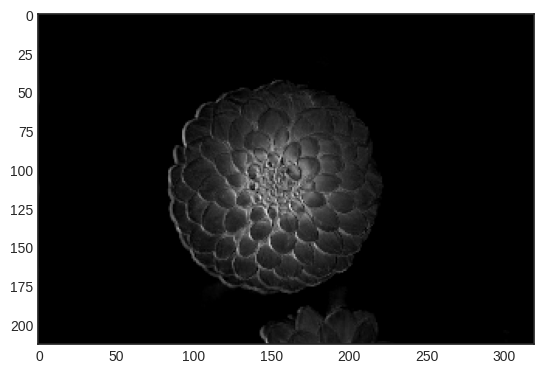

In [ ]:
plt.imshow(output[0,:,:,2] ,cmap='gray')
plt.show()

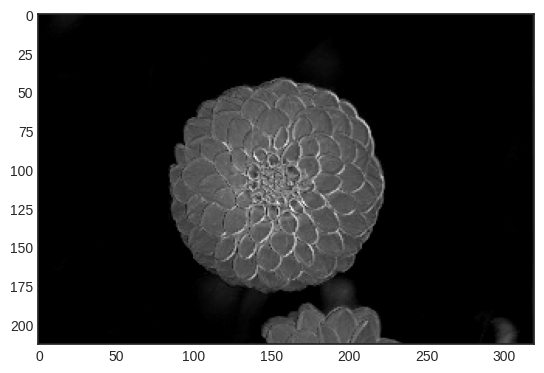

In [ ]:
plt.imshow(output[0,:,:,8] ,cmap='gray')
plt.show()

## 전역 평균 풀링(Global Avg Pooling)

- 특징 맵 각각의 평균값을 출력하는 것이므로, 특성맵에 있는 대부분의 정보를 잃음
- 출력층에는 유용할 수 있음

In [ ]:
from tensorflow.keras.layers import GlobalAvgPool2D

In [ ]:
#print(flower.shape)

output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = GlobalAvgPool2D()(output)
print(output.shape)

TypeError: ignored

# 완전 연결 계층(Fully-Connected Layer)

- 입력으로 받은 텐서를 1차원으로 평면화(flatten) 함
- 밀집 계층(Dense Layer)라고도 함
- 일반적으로 분류기로서 네트워크의 마지막 계층에서 사용

In [ ]:
from tensorflow.keras.layers import Dense

In [ ]:
output_size=64

In [ ]:
fc = Dense(units=output_size, activation='relu')

# 유효 수용 영역(ERF, Effective Receptive Field)

- 입력 이미지에서 거리가 먼 요소를 상호 참조하여 결합하여 네트워크 능력에 영향을 줌
- 입력 이미지의 영역을 정의해 주어진 계층을 위한 뉴런의 활성화에 영향을 미침
- 한 계층의 필터 크기나 윈도우 크기로 불리기 때문에 RF(receptive field, 수용 영역)이라는 용어를 흔히 볼 수 있음

  <img src="https://wiki.math.uwaterloo.ca/statwiki/images/8/8c/understanding_ERF_fig0.png">

- RF의 중앙에 위치한 픽셀은 주변에 있는 픽셀보다 더 높은 가중치를 가짐
  - 중앙부에 위치한 픽셀은 여러 개의 계층을 전파한 값
  - 중앙부에 있는 픽셀은 주변에 위치한 픽셀보다 더 많은 정보를 가짐

- 가우시안 분포를 따름

  <img src="https://www.researchgate.net/publication/316950618/figure/fig4/AS:495826810007552@1495225731123/The-receptive-field-of-each-convolution-layer-with-a-3-3-kernel-The-green-area-marks.png">

# CNN 모델 학습

## MNIST (LeNet)

- Yann LeCun 등의 제안(1998)
- 5 계층 구조: Conv-Pool-Conv- Pool-Conv-FC-FC(SM)
- 입력 : 32x32 필기체 숫자 영상 (MNIST 데이터)
- 풀링 : 가중치x(2x2블록의 합) + 편차항  
- 시그모이드 활성화 함수 사용
- 성능: 오차율 0.95%(정확도: 99.05%)

  <img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  <center>[LeNet-5 구조]</center>

### 모듈 임포트

In [ ]:
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from tensorflow.keras.datasets import mnist

import numpy as np

### 데이터 로드 및 전처리

In [ ]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train[..., np.newaxis], x_test[..., np.newaxis] #채널이 한개다

print(x_train.shape)
print(x_test.shape)
print(x_test.shape)
print(y_test.shape)

11490434/11490434 [==============================] - 2s 0us/step
(60000, 28, 28, 1)
(10000, 28, 28, 1)
(10000, 28, 28, 1)
(10000,)


In [ ]:
plt.imshow(x_train[0,:,:,0])
plt.show()

NameError: ignored

In [ ]:
x_train, x_test = x_train/255.0, x_test/255.0

### 모델 구성 및 컴파일

In [ ]:
num_classes = 10
epochs = 30
batch_size = 32

In [ ]:
class LeNet5(Model):
    def __init__(self, num_calsses):
        super(LeNet5, self).__init__()
        self.conv1 = Conv2D(6, kernel_size=(5, 5), padding='same', activation='relu')
        self.conv2 = Conv2D(16, kernel_size=(5, 5), activation='relu')
        self.max_pool = MaxPool2D(pool_size = (2,2))
        self.flatten = Flatten()
        self.dense1 = Dense(120, activation='relu')
        self.dense2 = Dense(84, activation='relu')
        self.dense3 = Dense(num_classes, activation='softmax')

def call(self, input_data):
    x = self.max_pool(self.conv1(input_data))
    x = self.max_pool(self.conv2(x))
    x = self.fatten(x)
    x = self.dense3(self.dense2(self.dense1(x)))

    return x

In [ ]:
model = LeNet5(num_classes)

In [ ]:
model.compile(optimizer='sgd',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
callbacks = [EarlyStopping(patience=3, monitor='val_loss'),
             TensorBoard(log_dir='./logs', histogram_freq=1)]

### 모델 학습 및 평가

In [ ]:
model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          validation_data=(x_test, y_test),
          callbacks=callbacks)

Epoch 1/30


NotImplementedError: ignored

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Fashion MNIST

<img src="https://www.tensorflow.org/tutorials/keras/classification_files/output_oZTImqg_CaW1_0.png?hl=ko" width="500">

### 모듈 임포트

In [ ]:
import datetime
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.datasets.fashion_mnist import load_data
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout, Input

<ipython-input-8-e15ee9ffb2bf>:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')



### 데이터 로드 및 전처리

In [ ]:
(x_train, y_train), (x_test, y_test) = load_data()

x_train = x_train[..., np.newaxis]
x_test = x_test[..., np.newaxis]

x_train = x_train / 255.
x_test = x_test / 255.

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)


4422102/4422102 [==============================] - 1s 0us/step
(60000, 28, 28, 1)
(60000,)
(10000, 28, 28, 1)
(10000,)


In [ ]:
class_names = ['T-shirt/top,', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

### 모델 구성 및 학습
- 임의의 모델

In [ ]:
def build_model():
    model = Sequential()

    input = Input(shape=(28, 28, 1))
    output = Conv2D(filters=32, kernel_size=(3,3))(input)
    output = Conv2D(filters=64, kernel_size=(3,3))(output)
    output = Conv2D(filters=64, kernel_size=(3,3))(output)
    output = Flatten()(output)
    output = Dense(128, activation='relu')(output)
    output = Dense(64, activation='relu')(output)
    output = Dense(10, activation='softmax')(output)

    model = Model(inputs=[input], outputs = output)

    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['acc'])
    return model

model_1 = build_model()
model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 64)        18496     
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 64)        36928     
                                                                 
 flatten (Flatten)           (None, 30976)             0         
                                                                 
 dense (Dense)               (None, 128)               3965056   
                                                                 
 dense_1 (Dense)             (None, 64)                8256  

In [ ]:
hist_1 = model_1.fit(x_train, y_train,
                     epochs=25,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/25
329/329 [==============================] - 17s 15ms/step - loss: 0.5229 - acc: 0.8144 - val_loss: 0.3905 - val_acc: 0.8603
Epoch 2/25
329/329 [==============================] - 4s 13ms/step - loss: 0.3508 - acc: 0.8709 - val_loss: 0.3727 - val_acc: 0.8657
Epoch 3/25
329/329 [==============================] - 4s 13ms/step - loss: 0.2975 - acc: 0.8908 - val_loss: 0.3530 - val_acc: 0.8737
Epoch 4/25
329/329 [==============================] - 4s 14ms/step - loss: 0.2509 - acc: 0.9053 - val_loss: 0.3904 - val_acc: 0.8666
Epoch 5/25
329/329 [==============================] - 4s 13ms/step - loss: 0.2177 - acc: 0.9190 - val_loss: 0.4097 - val_acc: 0.8747
Epoch 6/25
329/329 [==============================] - 4s 13ms/step - loss: 0.1911 - acc: 0.9288 - val_loss: 0.4432 - val_acc: 0.8644
Epoch 7/25
329/329 [==============================] - 4s 13ms/step - loss: 0.1741 - acc: 0.9348 - val_loss: 0.4288 - val_acc: 0.8720
Epoch 8/25
329/329 [==============================] - 4s 13ms/step -

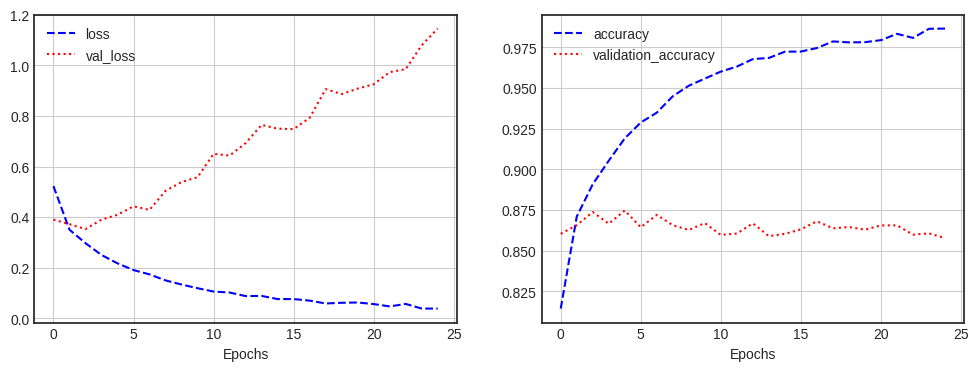

In [ ]:
hist_1.history.keys()

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_1.history['loss'], 'b--', label='loss')
plt.plot(hist_1.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_1.history['acc'], 'b--', label='accuracy')
plt.plot(hist_1.history['val_acc'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [ ]:
model_1.evaluate(x_test, y_test)

313/313 [==============================] - 2s 6ms/step - loss: 1.1937 - acc: 0.8547


[1.1937389373779297, 0.8547000288963318]

### 모델 구성 및 학습: 과대적합 방지

- 학습 파라미터의 수 비교

In [ ]:
def build_model2():
    model = Sequential()

    input = Input(shape=(28, 28, 1))
    output = Conv2D(filters=32, kernel_size=(3,3))(input)
    output = MaxPool2D(strides=(2,2))(output)  #컨볼루션과 컨볼루션 사이에 특징을 잘 파악할 숭 ㅣㅆ또록 maxpool추가
    output = Conv2D(filters=64, kernel_size=(3,3))(output)
    output = Dropout(0.4)(output) #벨리데이션의 로스를 낮추기위해 dropout추가
    output = MaxPool2D(strides=(2,2))(output)
    output = Conv2D(filters=64, kernel_size=(3,3))(output)
    output = Dropout(0.4)(output)
    output = MaxPool2D(strides=(2,2))(output)
    output = Flatten()(output)
    output = Dense(128, activation='relu')(output)
    output = Dropout(0.5)(output)
    output = Dense(64, activation='relu')(output)
    output = Dropout(0.5)(output)
    output = Dense(10, activation='softmax')(output)

    model = Model(inputs=[input], outputs = output)

    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['acc'])
    return model

model_2 = build_model2()
model_2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 conv2d_4 (Conv2D)           (None, 11, 11, 64)        18496     
                                                                 
 dropout (Dropout)           (None, 11, 11, 64)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                       

In [ ]:
hist_2 = model_2.fit(x_train, y_train,
                     epochs=40,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/40
329/329 [==============================] - 5s 8ms/step - loss: 1.1888 - acc: 0.5656 - val_loss: 0.7019 - val_acc: 0.7553
Epoch 2/40
329/329 [==============================] - 2s 7ms/step - loss: 0.7445 - acc: 0.7287 - val_loss: 0.6313 - val_acc: 0.7666
Epoch 3/40
329/329 [==============================] - 2s 8ms/step - loss: 0.6607 - acc: 0.7656 - val_loss: 0.5584 - val_acc: 0.7912
Epoch 4/40
329/329 [==============================] - 3s 8ms/step - loss: 0.6103 - acc: 0.7830 - val_loss: 0.5403 - val_acc: 0.8041
Epoch 5/40
329/329 [==============================] - 2s 7ms/step - loss: 0.5838 - acc: 0.7930 - val_loss: 0.5138 - val_acc: 0.8050
Epoch 6/40
329/329 [==============================] - 3s 8ms/step - loss: 0.5620 - acc: 0.8028 - val_loss: 0.5175 - val_acc: 0.8001
Epoch 7/40
329/329 [==============================] - 2s 7ms/step - loss: 0.5324 - acc: 0.8129 - val_loss: 0.4841 - val_acc: 0.8217
Epoch 8/40
329/329 [==============================] - 3s 8ms/step - loss: 0.

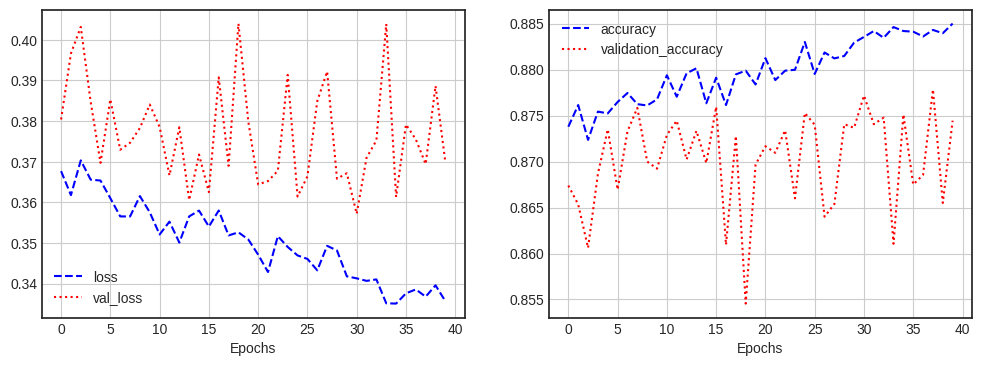

In [ ]:

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_2.history['loss'], 'b--', label='loss')
plt.plot(hist_2.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_2.history['acc'], 'b--', label='accuracy')
plt.plot(hist_2.history['val_acc'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [ ]:
model_2.evaluate(x_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 0.3857 - acc: 0.8691


[0.3856554627418518, 0.8690999746322632]

### 모델 성능 높이기: 레이어 추가

In [ ]:
from tensorflow.keras.layers import BatchNormalization

In [ ]:
def build_model3():
    model = Sequential()

    input = Input(shape=(28, 28, 1))
    output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same')(input)
    output = BatchNormalization()(output)
    output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='valid')(output)
    output = Dropout(0.5)(output) #벨리데이션의 로스를 낮추기위해 dropout추가
    output = MaxPool2D(strides=(2,2))(output)

    output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same')(output)
    output = BatchNormalization()(output)
    output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='valid')(output)
    output = Dropout(0.5)(output)
    output = MaxPool2D(strides=(2,2))(output)

    output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='same')(output)
    output = BatchNormalization()(output)
    output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='valid')(output)
    output = Dropout(0.5)(output)
    output = MaxPool2D(strides=(2,2))(output)


    output = Flatten()(output)
    output = Dense(512, activation='relu')(output)
    output = Dropout(0.5)(output)
    output = Dense(256, activation='relu')(output)
    output = Dropout(0.5)(output)
    output = Dense(10, activation='softmax')(output)

    model = Model(inputs=[input], outputs = output)

    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['acc'])
    return model

model_3 = build_model3()
model_3.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 64)        640       
                                                                 
 batch_normalization (BatchN  (None, 28, 28, 64)       256       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 26, 26, 64)        36928     
                                                                 
 dropout (Dropout)           (None, 26, 26, 64)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 64)       0         
 )                                                           

In [ ]:
hist_3 = model_3.fit(x_train, y_train,
                     epochs=25,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/25
329/329 [==============================] - 27s 32ms/step - loss: 0.7822 - acc: 0.7140 - val_loss: 2.0941 - val_acc: 0.2463
Epoch 2/25
329/329 [==============================] - 9s 29ms/step - loss: 0.4568 - acc: 0.8374 - val_loss: 1.1383 - val_acc: 0.5908
Epoch 3/25
329/329 [==============================] - 10s 30ms/step - loss: 0.3846 - acc: 0.8680 - val_loss: 0.7432 - val_acc: 0.8099
Epoch 4/25
329/329 [==============================] - 10s 30ms/step - loss: 0.3400 - acc: 0.8827 - val_loss: 0.6157 - val_acc: 0.7542
Epoch 5/25
329/329 [==============================] - 9s 29ms/step - loss: 0.3145 - acc: 0.8913 - val_loss: 0.6111 - val_acc: 0.7951
Epoch 6/25
329/329 [==============================] - 10s 30ms/step - loss: 0.3061 - acc: 0.8933 - val_loss: 0.4953 - val_acc: 0.8466
Epoch 7/25
329/329 [==============================] - 9s 29ms/step - loss: 0.2779 - acc: 0.9036 - val_loss: 0.5315 - val_acc: 0.8558
Epoch 8/25
329/329 [==============================] - 9s 29ms/ste

- 과대적합은 되지 않았고, 층을 늘려도 좋은 성능을 낼 수 있음

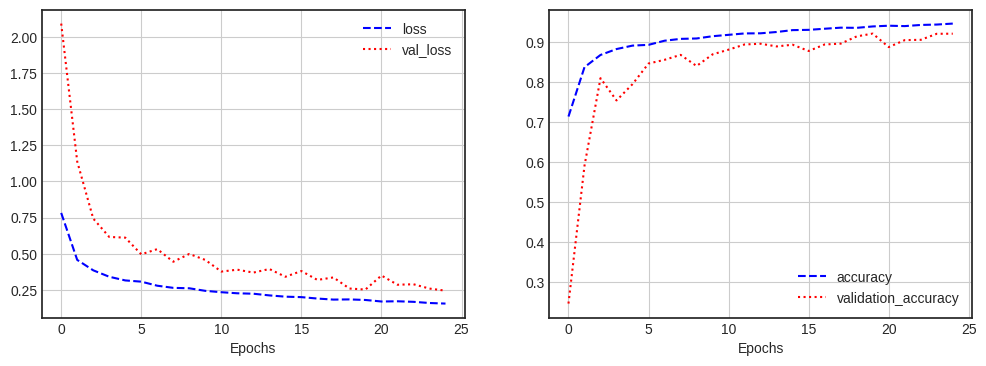

In [ ]:

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_3.history['loss'], 'b--', label='loss')
plt.plot(hist_3.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_3.history['acc'], 'b--', label='accuracy')
plt.plot(hist_3.history['val_acc'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [ ]:
model_3.evaluate(x_test, y_test)

313/313 [==============================] - 1s 4ms/step - loss: 0.2491 - acc: 0.9189


[0.24911177158355713, 0.9189000129699707]

### 모델 성능 높이기: 이미지 보강(Image Augmentation)

- 주요 인자 참고: https://keras.io/ko/preprocessing/image/

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
image_generator = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.2,
    shear_range=0.6,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False
)

augment_size = 200

print(x_train.shape)
print(x_train[0].shape)

(60000, 28, 28, 1)
(28, 28, 1)


In [ ]:
x_augment = image_generator.flow(np.tile(x_train[0].reshape(28*28*1), augment_size).reshape(-1, 28, 28, 1),
                                         np.zeros(augment_size), batch_size=augment_size, shuffle=False).next()[0]

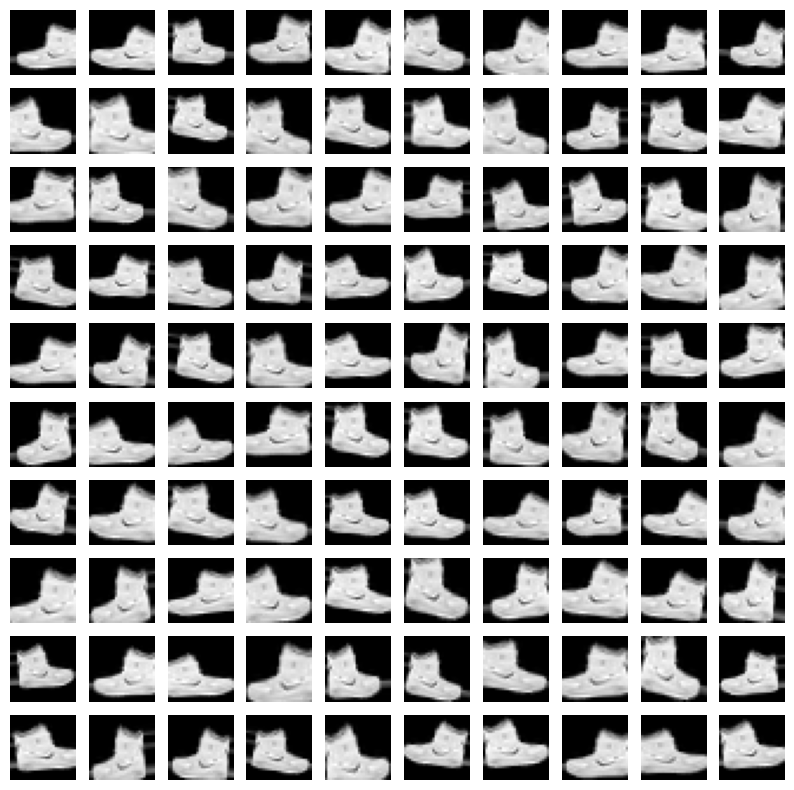

In [ ]:
plt.figure(figsize=(10,10))
for i in range(1, 101):
    plt.subplot(10, 10, i)
    plt.axis('off')
    plt.imshow(x_augment[i-1].reshape(28, 28), cmap='gray')

데이터 추가

In [ ]:
image_generator = ImageDataGenerator(
    rotation_range=15,
    zoom_range=0.1,
    shear_range=0.6,
    width_shift_range=0.15,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False
)

augment_size = 30000

random_mask = np.random.randint(x_train.shape[0], size=augment_size)
x_augmented = x_train[random_mask].copy()
y_augmented = y_train[random_mask].copy()

In [ ]:
x_augmented = image_generator.flow(x_augmented, np.zeros(augment_size),
                                   batch_size=augment_size, shuffle=False).next()[0]

x_train = np.concatenate((x_train, x_augmented))
y_train = np.concatenate((y_train, y_augmented))

print(x_train.shape)
print(y_train.shape)

(90000, 28, 28, 1)
(90000,)


In [ ]:
model_4 = build_model3()
model_4.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 28, 28, 64)        640       
                                                                 
 batch_normalization_6 (Batc  (None, 28, 28, 64)       256       
 hNormalization)                                                 
                                                                 
 conv2d_13 (Conv2D)          (None, 26, 26, 64)        36928     
                                                                 
 dropout_10 (Dropout)        (None, 26, 26, 64)        0         
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 13, 13, 64)       0         
 2D)                                                       

In [ ]:
hist_4 = model_4.fit(x_train, y_train,
                     epochs=40,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/40
493/493 [==============================] - 19s 31ms/step - loss: 0.7109 - acc: 0.7464 - val_loss: 2.1319 - val_acc: 0.2622
Epoch 2/40
493/493 [==============================] - 14s 29ms/step - loss: 0.4096 - acc: 0.8563 - val_loss: 1.1513 - val_acc: 0.7140
Epoch 3/40
493/493 [==============================] - 16s 32ms/step - loss: 0.3529 - acc: 0.8772 - val_loss: 1.1952 - val_acc: 0.6474
Epoch 4/40
493/493 [==============================] - 14s 29ms/step - loss: 0.3232 - acc: 0.8880 - val_loss: 1.1015 - val_acc: 0.6494
Epoch 5/40
493/493 [==============================] - 15s 30ms/step - loss: 0.3041 - acc: 0.8944 - val_loss: 1.0761 - val_acc: 0.7004
Epoch 6/40
493/493 [==============================] - 14s 29ms/step - loss: 0.2853 - acc: 0.9020 - val_loss: 1.1263 - val_acc: 0.6535
Epoch 7/40
493/493 [==============================] - 14s 29ms/step - loss: 0.2700 - acc: 0.9059 - val_loss: 1.0135 - val_acc: 0.7047
Epoch 8/40
493/493 [==============================] - 14s 29ms

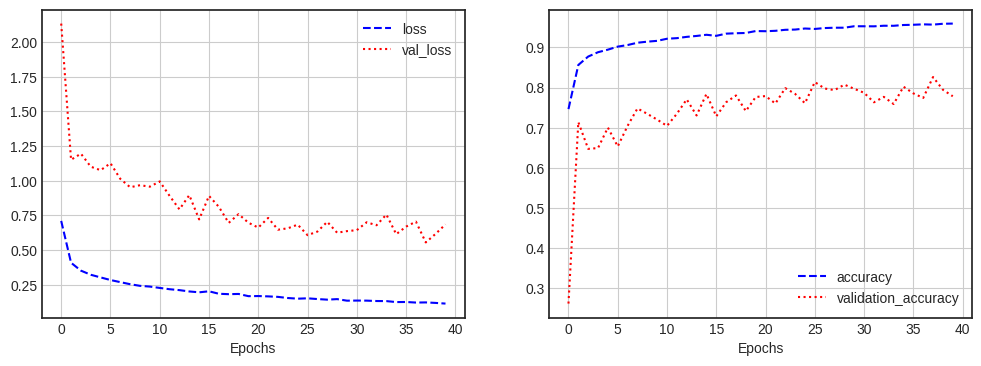

In [ ]:

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_4.history['loss'], 'b--', label='loss')
plt.plot(hist_4.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_4.history['acc'], 'b--', label='accuracy')
plt.plot(hist_4.history['val_acc'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

- 학습 인자를 이전과 다르게 주면서 학습하면 더 잘 나올것으로 판단

In [ ]:
model_4.evaluate(x_test, y_test)

313/313 [==============================] - 1s 4ms/step - loss: 0.2863 - acc: 0.9120


[0.28625091910362244, 0.9120000004768372]

## CIFAR-10

* CIFAR-10
  - 10개의 클래스로 구분된 32 x 32 사물 사진을 모은 데이터셋
  - 50,000개의 학습데이터, 10,000개의 테스트 데이터로 구성
  - 데이터 복잡도가 MNIST보다 훨씬 높은 특징이 있음
    - 단순한 신경망으로 특징을 검출하기 어려움


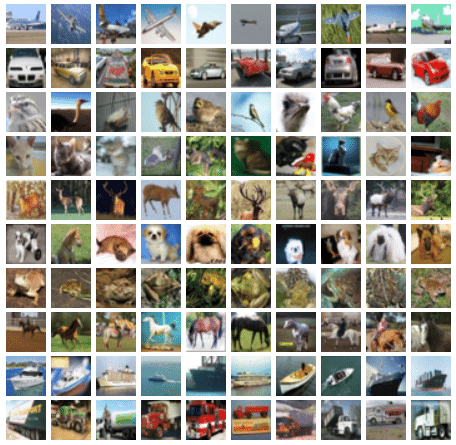

# CNN 모델의 발전

* 1998: LeNet – Gradient-based Learning Applied to Document Recognition
* 2012: AlexNet – ImageNet Classification with Deep Convolutional Neural Network
* **2014: VggNet – Very Deep Convolutional Networks for Large-Scale Image Recognition**
* **2014: GooLeNet – Going Deeper with Convolutions**
* 2014: SppNet – Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition
* **2015: ResNet – Deep Residual Learning for Image Recognition**
* **2016: Xception – Xception: Deep Learning with Depthwise Separable Convolutions**
* **2017: MobileNet – MobileNets: Efficient Convolutional Neural Networks for Mobile Vision Application**
* **2017: DenseNet – Densely Connected Convolutional Networks**
* 2017: SeNet – Squeeze and Excitation Networks
* 2017: ShuffleNet – ShuffleNet: An Extremely Efficient Convolutional Neural Network for Mobile Devices
* **2018: NasNet – Learning Transferable Architectures for Scalable Image Recognition**
* 2018: Bag of Tricks – Bag of Tricks for Image Classification with Convolutional Neural Networks
* **2019: EfficientNet – EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks**


## VGGNet(Visual Geometry Group Net)

- 2014년 ILSVRC에서 2등 차지 (상위-5 오류율: 7.32%), 이 후의 수많은 연구에 영향을 미침

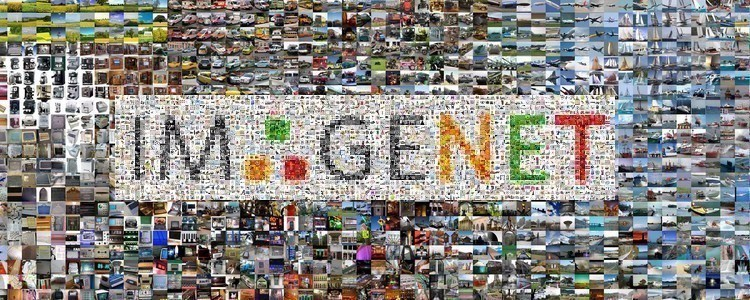

- 특징
  - 활성화 함수로 `ReLU` 사용, Dropout 적용
  - 합성곱과 풀링 계층으로 구성된 블록과 분류를 위한 완전 연결계층으로 결합된 전형적인 구조
  - 이미지 변환, 좌우 반전 등의 변환을 시도하여 인위적으로 데이터셋을 늘림
  - 몇 개의 합성곱 계층과 최대-풀링 계층이 따르는 5개의 블록과, 3개의 완전연결계층(학습 시, 드롭아웃 사용)으로 구성
  - 모든 합성곱과 최대-풀링 계층에 `padding='SAME'` 적용
  - 합성곱 계층에는 `stride=1`, 활성화 함수로 `ReLU` 사용
  - 특징 맵 깊이를 증가시킴
  - 척도 변경을 통한 데이터 보강(Data Augmentation)

- 기여

  - 3x3 커널을 갖는 두 합성곱 계층을 쌓은 스택이 5x5 커널을 갖는 하나의 합성곱 계층과 동일한 수용영역(ERF)을 가짐
  - 11x11 사이즈의 필터 크기를 가지는 AlexNet과 비교하여, 더 작은 합성곱 계층을 더 많이 포함해 더 큰 ERF를 얻음
  - 합성곱 계층의 개수가 많아지면, 매개변수 개수를 줄이고, 비선형성을 증가시킴

- VGG-16 모델(16개 층)

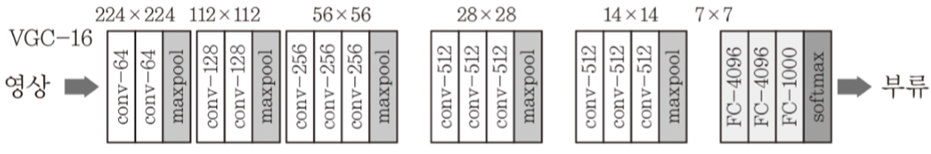

- VGG-19 모델(19개 층)  

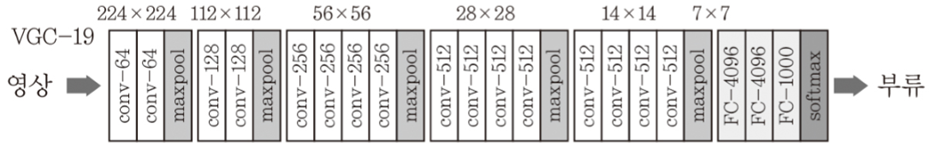

- ImageNet에서 훈련이 끝난 후 얻게된 매개변수 값 로딩
- 네트워크를 다시 처음부터 학습하고자 한다면 `weights=None`으로 설정, 케라스에서 무작위로 가중치를 설정함
- `include_top=False`: VGG의 밀집 계층을 제외한다는 뜻
- 해당 네트워크의 출력은 합성곱/최대-풀링 블록의 특징맵이 됨
- `pooling`: 특징맵을 반환하기 전에 적용할 선택적인 연산을 지정

In [ ]:
from keras.preprocessing import image
from keras.applications.vgg19 import VGG19, preprocess_input, decode_predictions

vggnet = VGG19(include_top=True, weights='imagenet',
               input_tensor=None, input_shape=None,
               pooling=None, classes=1000)
vggnet.summary()

574710816/574710816 [==============================] - 30s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

* dog.jpg (https://www.publicdomainpictures.net/pictures/250000/nahled/dog-beagle-portrait.jpg)

In [ ]:
!wget -O dog.jpg https://www.publicdomainpictures.net/pictures/250000/nahled/dog-beagle-portrait.jpg

--2023-06-03 19:55:35--  https://www.publicdomainpictures.net/pictures/250000/nahled/dog-beagle-portrait.jpg
Resolving www.publicdomainpictures.net (www.publicdomainpictures.net)... 104.20.122.60, 172.67.1.236, 104.20.123.60, ...
Connecting to www.publicdomainpictures.net (www.publicdomainpictures.net)|104.20.122.60|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 88498 (86K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>]  86.42K  --.-KB/s    in 0.01s   

2023-06-03 19:55:35 (6.47 MB/s) - ‘dog.jpg’ saved [88498/88498]



35363/35363 [==============================] - 0s 0us/step
[[('n02088364', 'beagle', 0.83938146), ('n02089973', 'English_foxhound', 0.08834782), ('n02089867', 'Walker_hound', 0.06238833), ('n02088238', 'basset', 0.004565096), ('n02088632', 'bluetick', 0.0033394652)]]


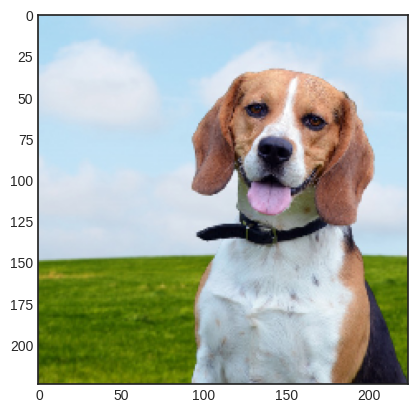

In [ ]:
img = tf.keras.utils.load_img('dog.jpg', target_size=(224, 224))
plt.imshow(img)
x = tf.keras.utils.img_to_array(img)
x = x.reshape(1, x.shape[0], x.shape[1], x.shape[2])
x = preprocess_input(x)

preds = vggnet.predict(x)
print(decode_predictions(preds))

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import random_split
from torch.utils.data.dataloader import DataLoader

from torchvision import datasets, transforms, models
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor
from torchvision.utils import make_grid

In [ ]:
import pandas as pd

data_dir = '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images'
labels = pd.read_csv('/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_data_fix_img.csv')
labels

,Image_File,Furniture_Type
0,/furniture_images/1634011558853_Furniture Set ...,Other
1,/furniture_images/1634011559093_Bed Room Set f...,Bed / bedroom item
2,/furniture_images/1634011559259_6by6 Teak Box ...,Bed / bedroom item
3,/furniture_images/1634011559590_New Spring Mat...,Bed / bedroom item
4,/furniture_images/1634011559751_Exclusive 6 by...,Bed / bedroom item
...,...,...
9341,/furniture_images/1634028757107_Library Cupboa...,Storage
9342,/furniture_images/1634028757269_Piyestra Cupbo...,Storage
9343,/furniture_images/1634028757678_Dark 3d wardro...,Bed / bedroom item
9344,/furniture_images/1634028757990_3 Door cupboar...,Bed / bedroom item


In [ ]:
labels['Image_File'] = '/content/drive/MyDrive/2023-1/gbt_캡스톤' + labels['Image_File']

In [ ]:
labels.head()

,Image_File,Furniture_Type
0,/content/drive/MyDrive/2023-1/gbt_캡스톤/fur...,Other
1,/content/drive/MyDrive/2023-1/gbt_캡스톤/fur...,Bed / bedroom item
2,/content/drive/MyDrive/2023-1/gbt_캡스톤/fur...,Bed / bedroom item
3,/content/drive/MyDrive/2023-1/gbt_캡스톤/fur...,Bed / bedroom item
4,/content/drive/MyDrive/2023-1/gbt_캡스톤/fur...,Bed / bedroom item


In [ ]:
Name = labels['Furniture_Type'].unique().tolist()
print(Name)
print(len(Name))

['Other', 'Bed / bedroom item', 'TV / stereo', 'Storage', 'Table / chair', 'Sofa / living room item', 'Antique / art', 'Lighting', 'Textiles / decoration']
9


In [ ]:
N=list(range(len(Name)))
normal_mapping=dict(zip(Name,N))
reverse_mapping=dict(zip(N,Name))


In [ ]:
labels['label']=labels['Furniture_Type'].map(normal_mapping)

In [ ]:
files = labels['Image_File'].unique().tolist()
print(files[0:10])
print(len(files))

['/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011558853_Furniture Set for sale.jpg', '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011559093_Bed Room Set for sale.jpg', '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011559259_6by6 Teak Box Bed with Hybrids Mattress for sale.jpg', '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011559590_New Spring Mattress for sale.jpg', '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011559751_Exclusive 6 by Teak Box Bed with Spring Mattress for sale.jpg', '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011559907_Tv Stand for sale.jpg', '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011560082_Exclusive 6 by 5 Teak Box Bed with Spring Mattress for sale.jpg', '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011560266_New Phoenix 6 Pc Drawer Set for sale.jpg', '/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_i

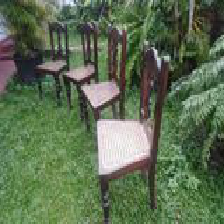

In [ ]:
img = tf.keras.utils.load_img('/content/drive/MyDrive/2023-1/gbt_캡스톤/furniture_images/1634011558853_Furniture Set for sale.jpg', target_size=(224, 224))
img

1/1 [==============================] - 0s 181ms/step
[[('n02870880', 'bookcase', 0.7486455), ('n03018349', 'china_cabinet', 0.12943794), ('n04550184', 'wardrobe', 0.057671346), ('n03742115', 'medicine_chest', 0.02617329), ('n03290653', 'entertainment_center', 0.011241351)]]


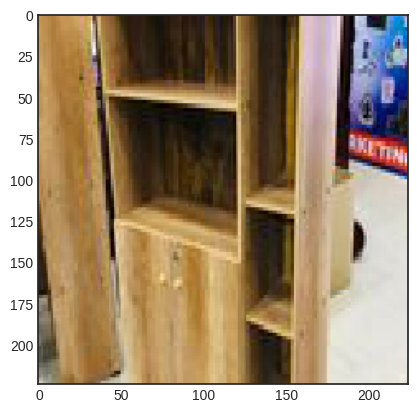

In [ ]:
img = tf.keras.utils.load_img(files[6543], target_size=(224, 224))
plt.imshow(img)
x = tf.keras.utils.img_to_array(img)
x = x.reshape(1, x.shape[0], x.shape[1], x.shape[2])
x = preprocess_input(x)

preds = vggnet.predict(x)
print(decode_predictions(preds))

In [ ]:
accuracies = []

for image_path in files:
    img = tf.keras.utils.load_img(image_path, target_size=(224, 224))
    x = tf.keras.utils.img_to_array(img)
    x = x.reshape(1, x.shape[0], x.shape[1], x.shape[2])
    x = preprocess_input(x)

    preds = vggnet.predict(x)
    _, _, top_class = decode_predictions(preds, top=1)[0][0]

    # 예측 결과와 실제 라벨 비교하여 정확도 계산
    accuracy = (top_class == labels.loc[image_path, 'Furniture_Type'])
    accuracies.append(accuracy)

# 정확도 평균 계산
avg_accuracy = sum(accuracies) / len(accuracies)
print(f"Average Accuracy: {avg_accuracy}")

1/1 [==============================] - 0s 23ms/step


KeyError: ignored

## EfficientNet

* EfficientNetB0인 작은 모델에서 주어진 Task에 최적화된 구조로 수정해나가는 형태
* 복잡한 Task에 맞춰 모델의 Capacity를 늘리기 위해 Wide Scaling, Deep Scaling, 그리고 Resolution Scaling을 사용
* EfficientNet은 Wide, Deep, Resolution을 함께 고려하는 Compound Scaling을 사용

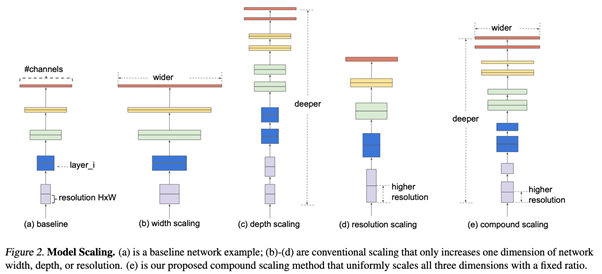

In [ ]:
from tensorflow.keras.applications.efficientnet import EfficientNetB1, preprocess_input, decode_predictions

efficientnet = EfficientNetB1(include_top=True, weights='imagenet',
                              input_tensor=None, input_shape=None,
                              pooling=None, classes=1000)

efficientnet.summary()

32148312/32148312 [==============================] - 2s 0us/step
Model: "efficientnetb1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 240, 240, 3)  0           ['input_2[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 240, 240, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescal

1/1 [==============================] - 0s 30ms/step
[[('n04550184', 'wardrobe', 0.637556), ('n03016953', 'chiffonier', 0.057652626), ('n03018349', 'china_cabinet', 0.03984702), ('n04515003', 'upright', 0.01688561), ('n04522168', 'vase', 0.009511041)]]


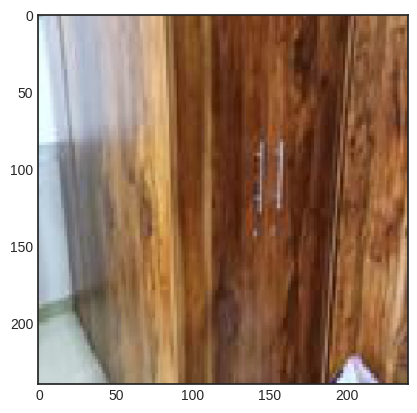

In [ ]:
img = tf.keras.utils.load_img(files[120], target_size=(240, 240))
plt.imshow(img)
x = tf.keras.utils.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = efficientnet.predict(x)
print(decode_predictions(preds))